In [1]:
import sys
import tensorflow as tf
sys.path.append("/visuworks/Blindless_AIFFELTON/Ablation Study/")

# import customized modules
import preprocess, data_generator, check_result, metrics, loss, train

sys.path.append("/visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet")
import dense_unet


# Insert Path
# {model_name}_{epoch}ep_{model_inpusize}_{Generator | aG/fG/sG}
INPUT_SHAPE = (512, 512, 1)
RESIZE_SHAPE = (1024, 1024, 1)

TRAIN_SOURCE = '/visuworks/Dataset/Selected Dataset 3/Train'
TEST_SOURCE = '/visuworks/Dataset/Selected Dataset 3/Test'

2024-02-15 12:54:35.625649: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-02-15 12:54:35.625675: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-02-15 12:54:35.626718: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-02-15 12:54:35.632020: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-02-15 12:54:36.208986: W tensorflow/compiler/tf2

2024-02-15 12:54:37.367130: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:901] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-02-15 12:54:37.402196: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:901] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-02-15 12:54:37.402417: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:901] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-

=====IOSTAR_STAR 30_ODC.jpg result======
sensitivity: 0.6493174853746866
specificity: 0.9945595704180278
IOU: 0.6121153761981879


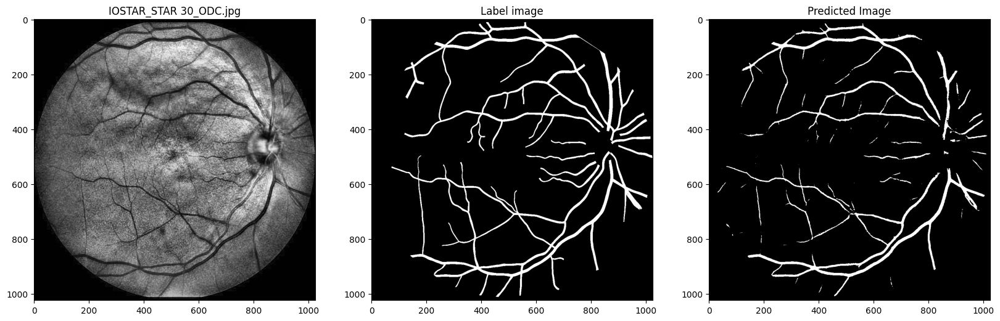

=====IOSTAR_STAR 24_OSC.jpg result======
sensitivity: 0.6628814950104556
specificity: 0.9929857412709734
IOU: 0.6079652355461685


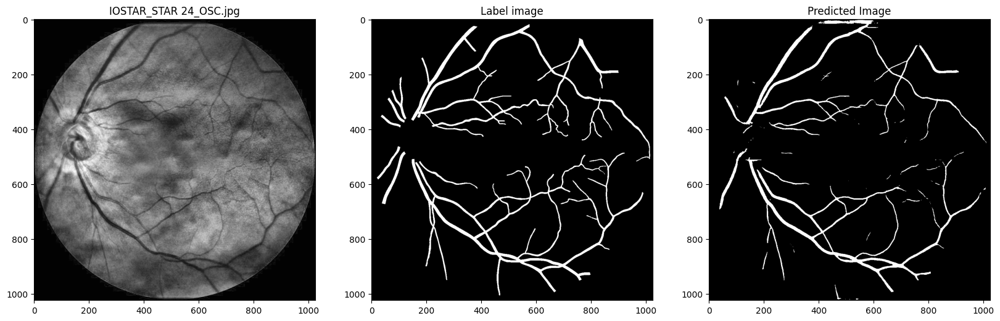

=====IOSTAR_STAR 40_OSC.jpg result======
sensitivity: 0.7555840268486814
specificity: 0.9887450566339504
IOU: 0.6730938216489744


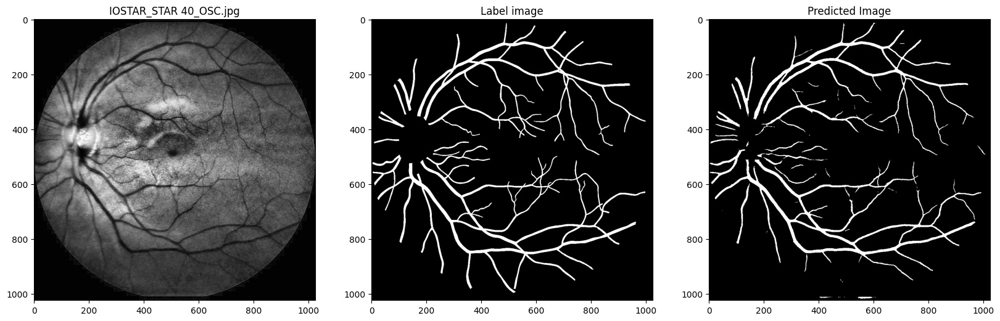

=====IOSTAR_STAR 16_OSN.jpg result======
sensitivity: 0.7275997383911053
specificity: 0.9877978192194028
IOU: 0.6176656151419558


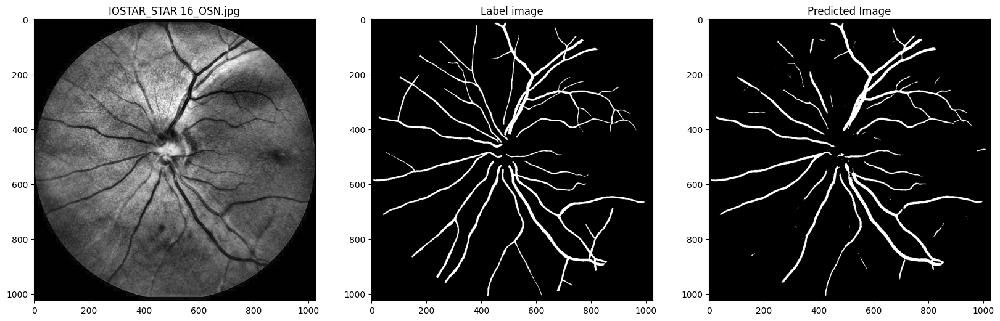

=====IOSTAR_STAR 48_OSN.jpg result======
sensitivity: 0.7580763065084963
specificity: 0.9907758182816626
IOU: 0.6799995398490705


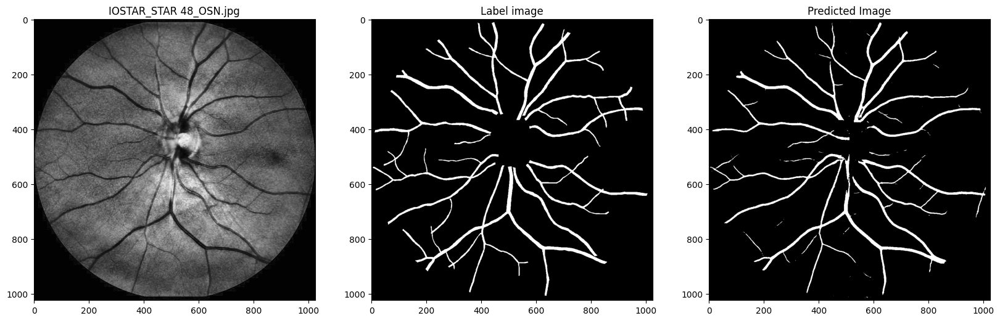

=====IOSTAR_STAR 45_ODC.jpg result======
sensitivity: 0.9020409432173224
specificity: 0.9778316940023958
IOU: 0.6735885411830254


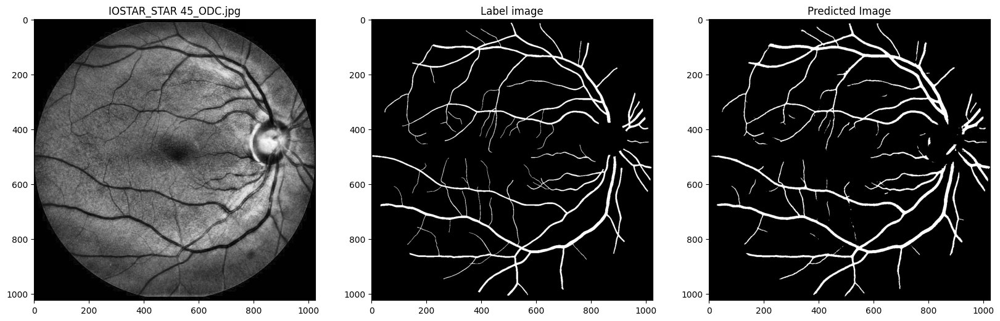

=====IOSTAR_STAR 32_ODC.jpg result======
sensitivity: 0.8867750439367311
specificity: 0.9686604862204885
IOU: 0.6115937051776732


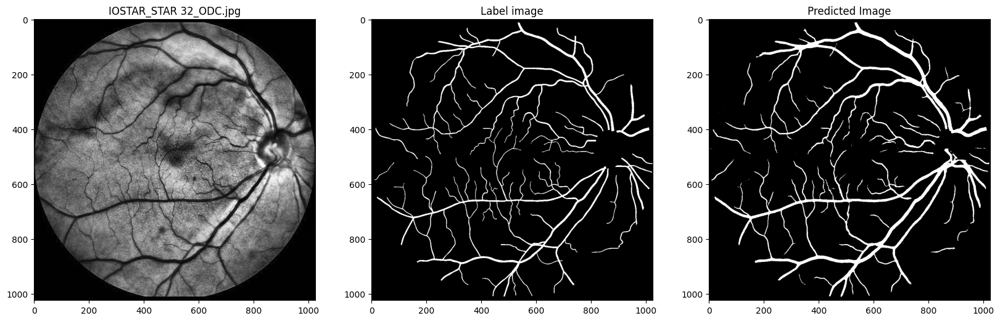

In [2]:
custom_objects = {'DiceLoss': loss.DiceLoss(), 
                  'sensitivity': metrics.sensitivity,
                  'specificity': metrics.specificity,
                  'accuracy' : metrics.accuracy,
                  'f1_score' : metrics.f1_score,
                  'iou' : metrics.iou}

MODEL_PATH = '/visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_50ep_512_sG_wo_slice.tf/41--0.1606-0.8070-0.9866-0.2147-0.7548-0.9828.pb'
TEST_SOURCE = '/visuworks/Dataset/Selected Dataset 3/Test'
test_preproc = preprocess.build_augmentation_for_general(RESIZE_SHAPE[0], RESIZE_SHAPE[0], is_train=False)
model = tf.keras.models.load_model(MODEL_PATH, custom_objects=custom_objects)

# file_list = ["AFIO", "ARIA", "Chase", "DR_HAGIS", "DRIVE", "DualModal", "FIVES", "HRF", "IOSTAR", "LES-AV", "ORVS", "RETA", "STARE", "TREND", "UoA-DR"]
# for file in file_list:
metrics.plot_result_for_SG(TEST_SOURCE, "IOSTAR", model=model, img_size=INPUT_SHAPE, resize_shape=RESIZE_SHAPE, preproc=test_preproc)`

=====AFIO_IM001791.JPG result======
sensitivity: 0.6656932166696735
specificity: 0.988504908906039
IOU: 0.592035859689938


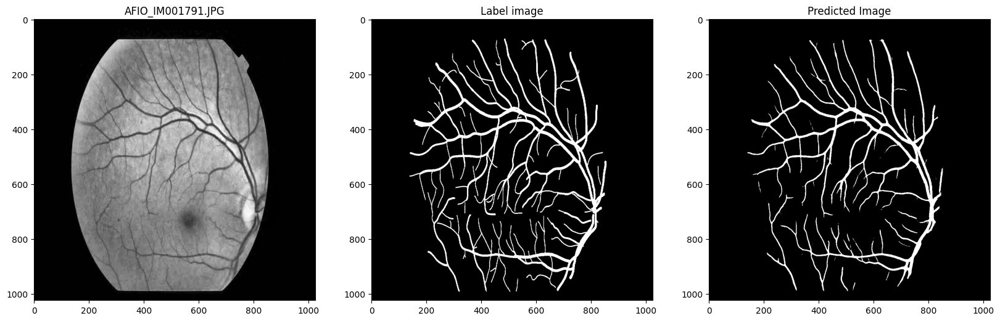

=====AFIO_IM001097.JPG result======
sensitivity: 0.6966412533408876
specificity: 0.9848591822283785
IOU: 0.5901730002712912


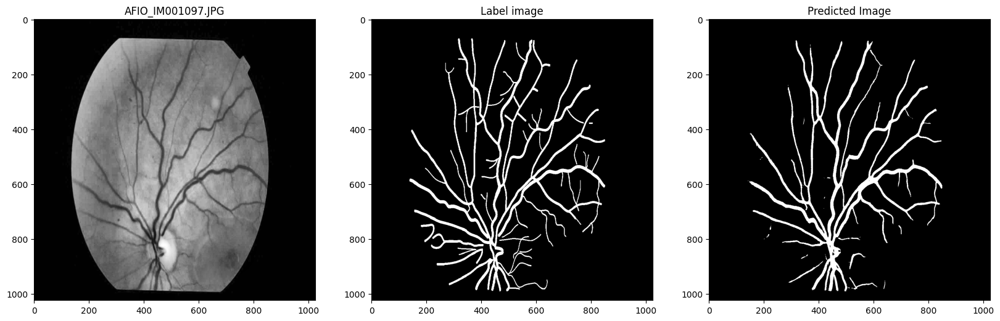

=====AFIO_IM005523.JPG result======
sensitivity: 0.643309380887701
specificity: 0.9885404958194225
IOU: 0.5742993487316892


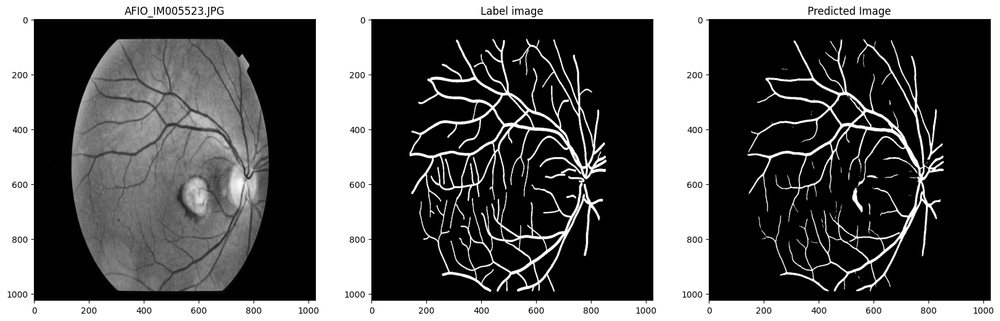

=====AFIO_IM000024.JPG result======
sensitivity: 0.6497936943517659
specificity: 0.9861482298734472
IOU: 0.5104845213722936


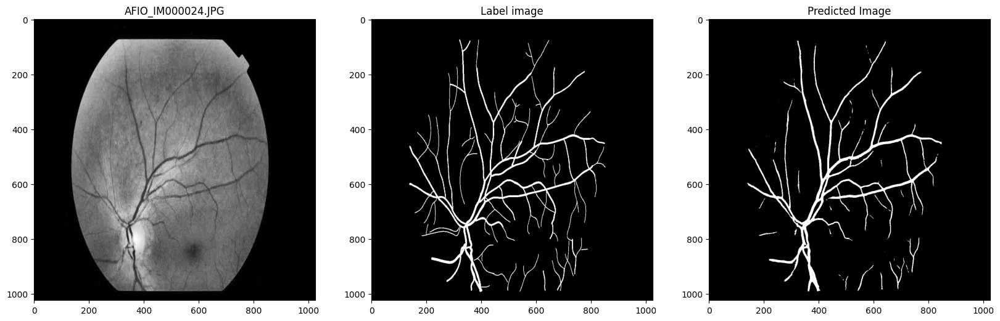

=====AFIO_IM005191.JPG result======
sensitivity: 0.6061061722123444
specificity: 0.9913750551228173
IOU: 0.5595197899080848


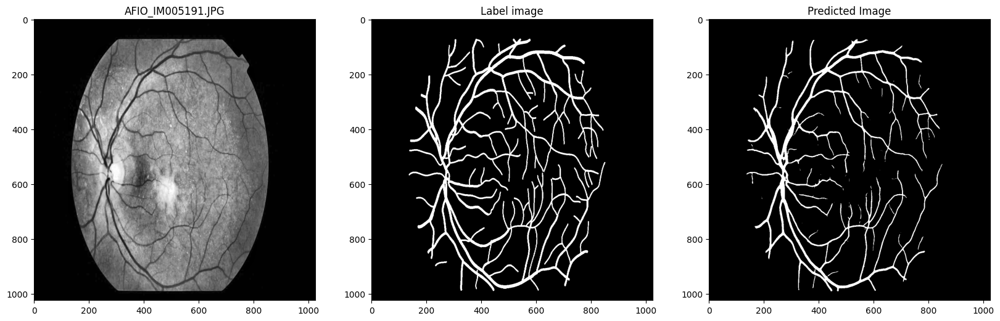

=====AFIO_IM001154.JPG result======
sensitivity: 0.6530998291432756
specificity: 0.987347874484294
IOU: 0.5682807688223426


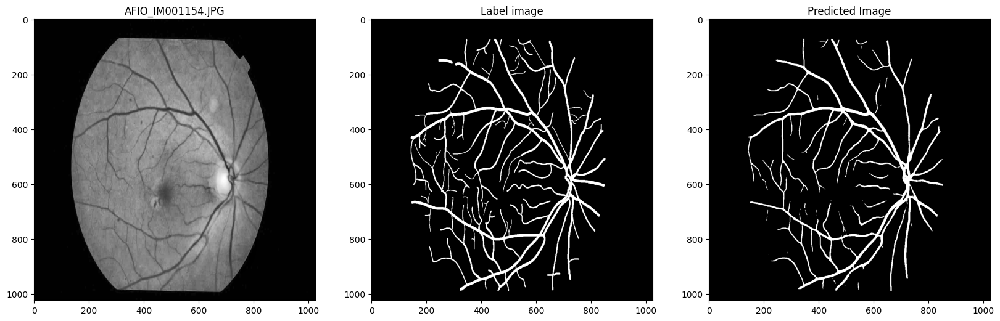

=====AFIO_IM001155.JPG result======
sensitivity: 0.6410200828817342
specificity: 0.9890027428719859
IOU: 0.564257974723326


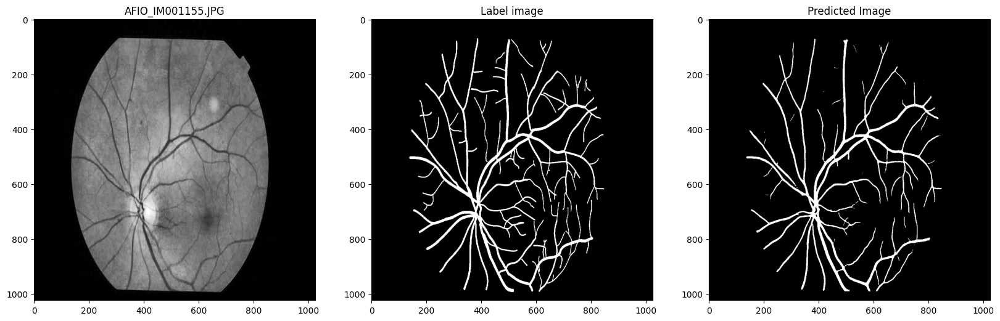

=====AFIO_IM001218.JPG result======
sensitivity: 0.6183999581779528
specificity: 0.9900707214790255
IOU: 0.5721760020637838


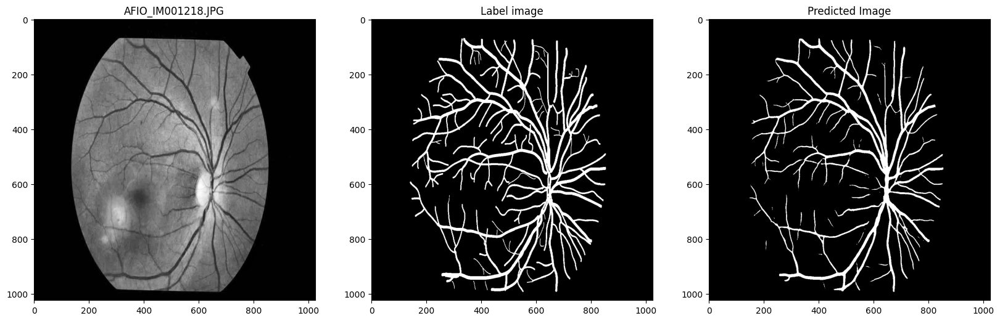

=====AFIO_IM001859.JPG result======
sensitivity: 0.6643099753640723
specificity: 0.9897089421486422
IOU: 0.579164760307051


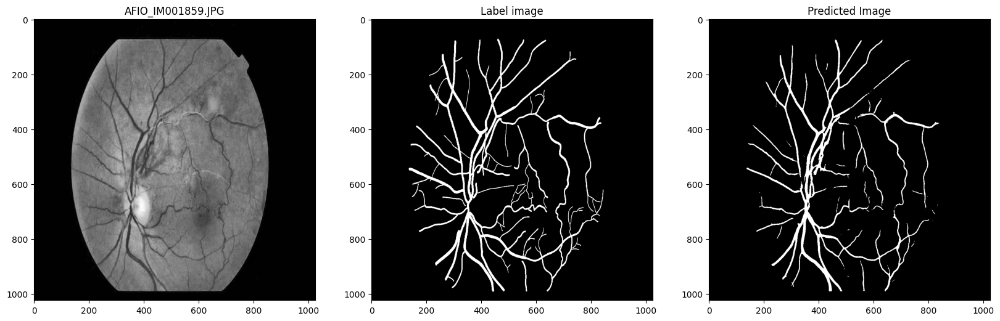

=====AFIO_IM003631.JPG result======
sensitivity: 0.6013097356313368
specificity: 0.9872597905819557
IOU: 0.5331186409035751


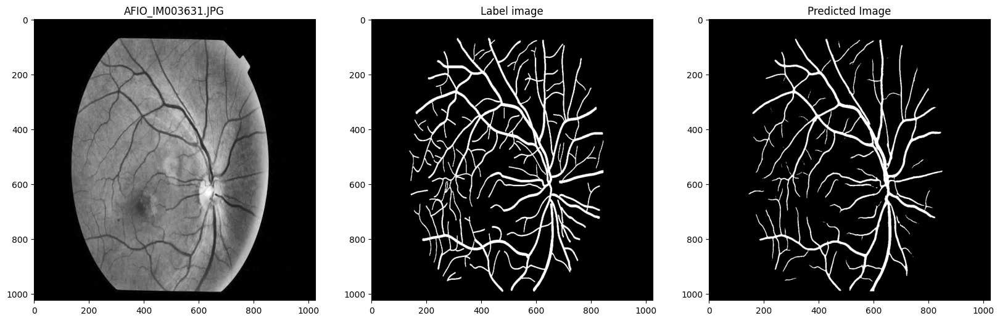

=====AFIO_IM004993.JPG result======
sensitivity: 0.616347198020052
specificity: 0.9896129699127898
IOU: 0.5468223115960701


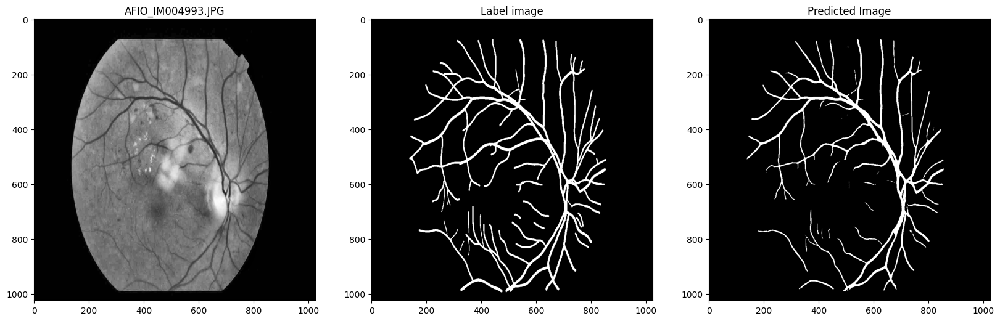

=====AFIO_IM002422.JPG result======
sensitivity: 0.6084710617047644
specificity: 0.9912013028979139
IOU: 0.5509498944561715


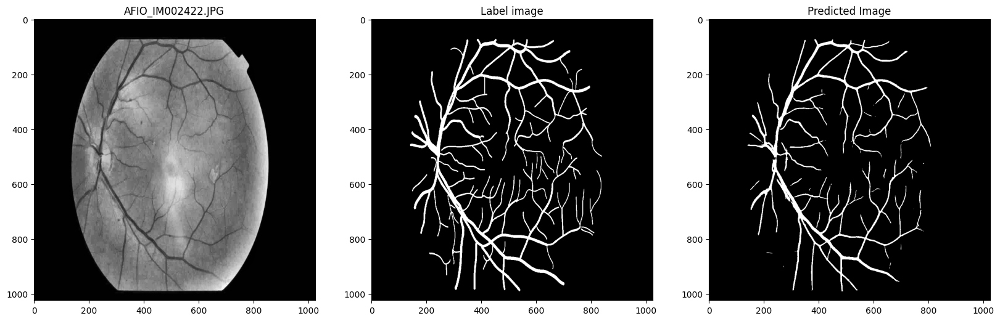

=====AFIO_IM006106.JPG result======
sensitivity: 0.5758383321860556
specificity: 0.9915565337326774
IOU: 0.5338651593198706


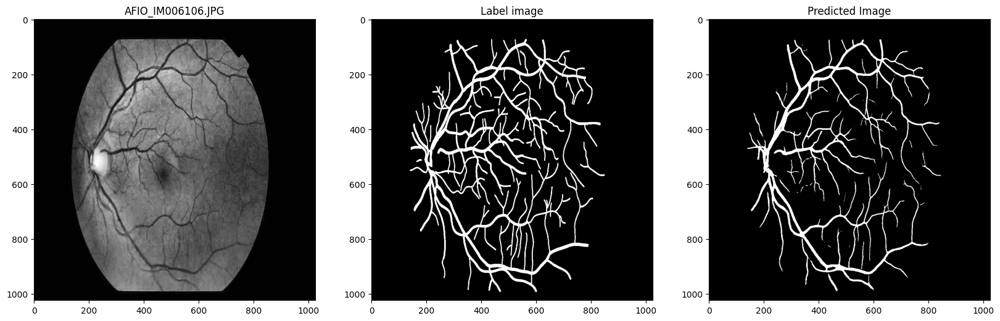

=====AFIO_IM005488.JPG result======
sensitivity: 0.6201248122685423
specificity: 0.9887165051122029
IOU: 0.564219210171189


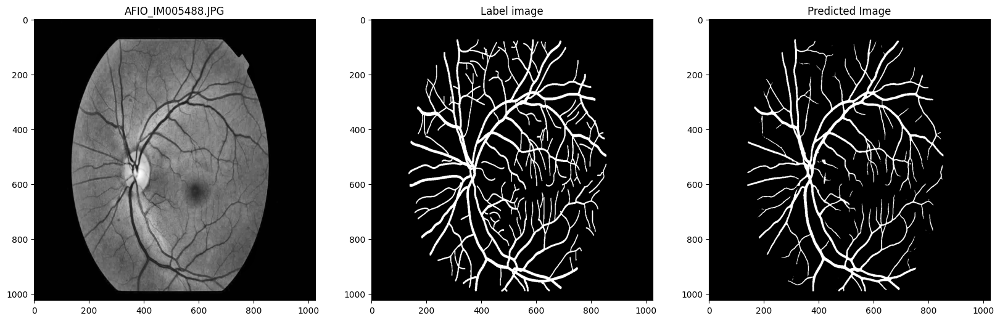

=====AFIO_IM005456.JPG result======
sensitivity: 0.6540376640556489
specificity: 0.9880556039608803
IOU: 0.557


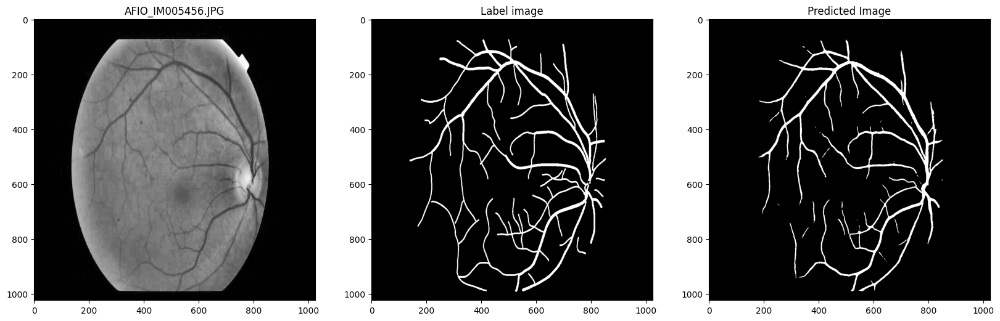

=====AFIO_IM005321.JPG result======
sensitivity: 0.7056009006473403
specificity: 0.9857206155849454
IOU: 0.5570533426163212


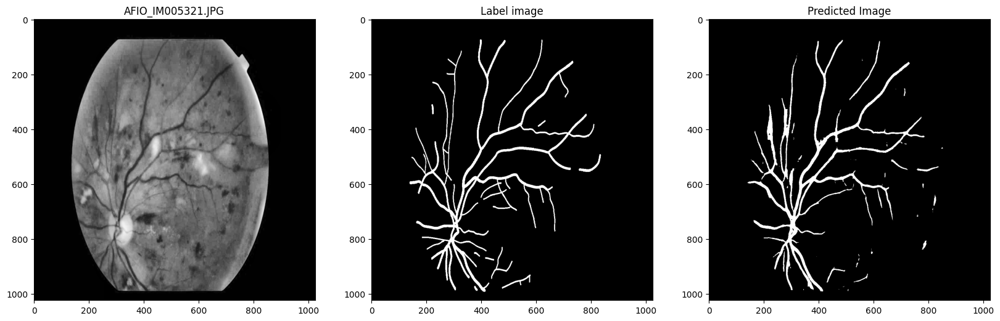

=====AFIO_IM005092.JPG result======
sensitivity: 0.6080207374194323
specificity: 0.9908333860392554
IOU: 0.5593396678083453


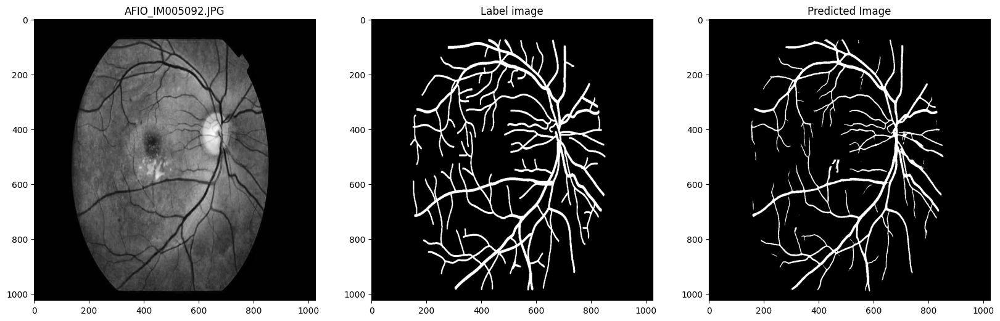

=====AFIO_IM004539.JPG result======
sensitivity: 0.5735141672425709
specificity: 0.9919539995097638
IOU: 0.5150903871518349


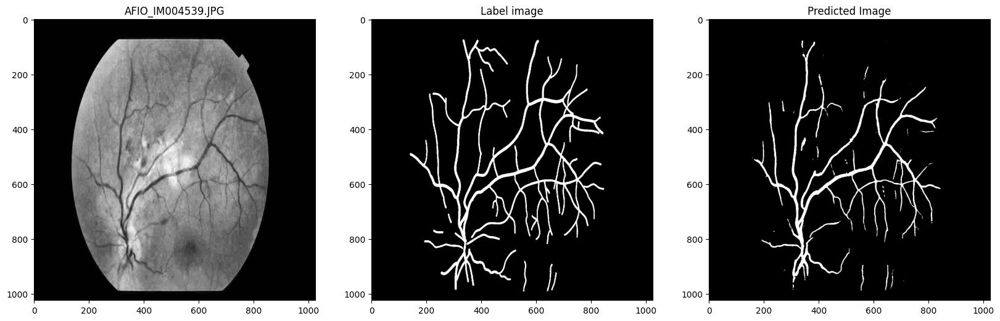

=====AFIO_IM004515.JPG result======
sensitivity: 0.63310281851691
specificity: 0.9908831772143053
IOU: 0.5769433732494419


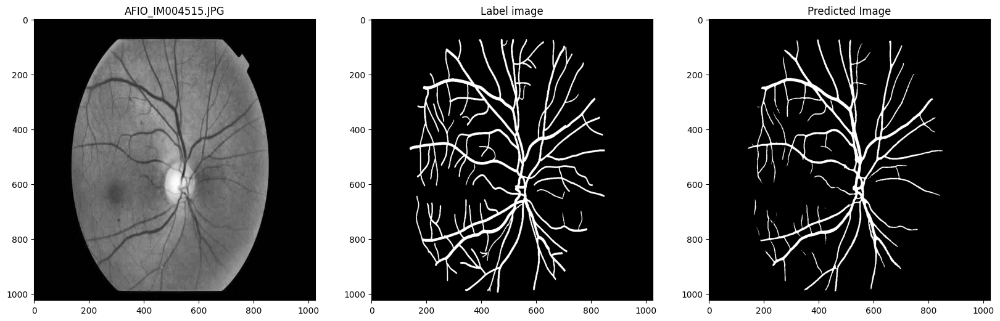

=====AFIO_IM002587.JPG result======
sensitivity: 0.6505759950184214
specificity: 0.9914368826506034
IOU: 0.5872041965738909


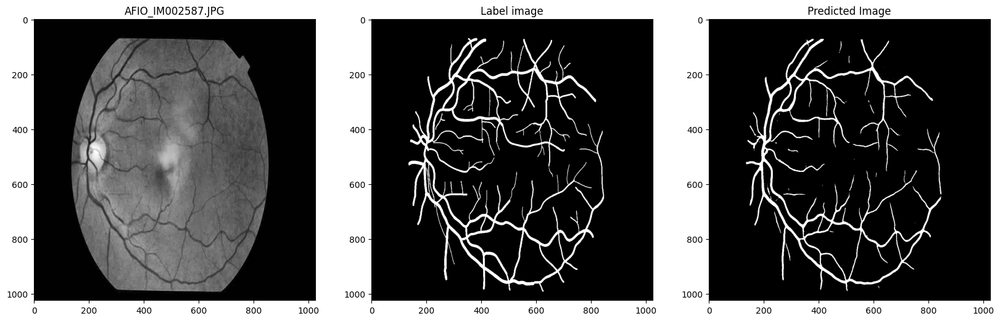

In [5]:
custom_objects = {'DiceLoss': loss.DiceLoss(), 
                  'sensitivity': metrics.sensitivity,
                  'specificity': metrics.specificity,
                  'accuracy' : metrics.accuracy,
                  'f1_score' : metrics.f1_score,
                  'iou' : metrics.iou}

MODEL_PATH = '/visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_50ep_512_sG_wo_slice.tf/41--0.1606-0.8070-0.9866-0.2147-0.7548-0.9828.pb'
TEST_SOURCE = '/visuworks/Dataset/Selected Dataset 3/Test'
test_preproc = preprocess.build_augmentation_for_general(RESIZE_SHAPE[0], RESIZE_SHAPE[0], is_train=False)
model = tf.keras.models.load_model(MODEL_PATH, custom_objects=custom_objects)

# file_list = ["AFIO", "ARIA", "Chase", "DR_HAGIS", "DRIVE", "DualModal", "FIVES", "HRF", "IOSTAR", "LES-AV", "ORVS", "RETA", "STARE", "TREND", "UoA-DR"]
# for file in file_list:
metrics.plot_result_for_SG(TEST_SOURCE, "AFIO", model=model, img_size=INPUT_SHAPE, resize_shape=RESIZE_SHAPE, preproc=test_preproc)

=====DRIVE_35.jpg result======
sensitivity: 0.7598123947197482
specificity: 0.9829840239645752
IOU: 0.6442226910367231


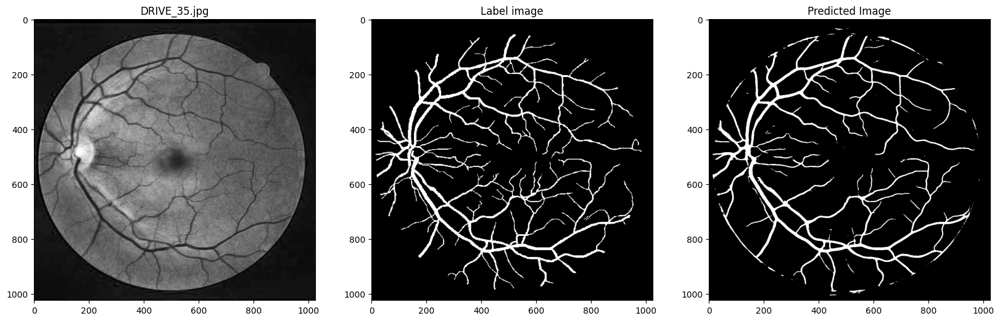

=====DRIVE_24.jpg result======
sensitivity: 0.7001754082565408
specificity: 0.987951183471841
IOU: 0.6411894239905884


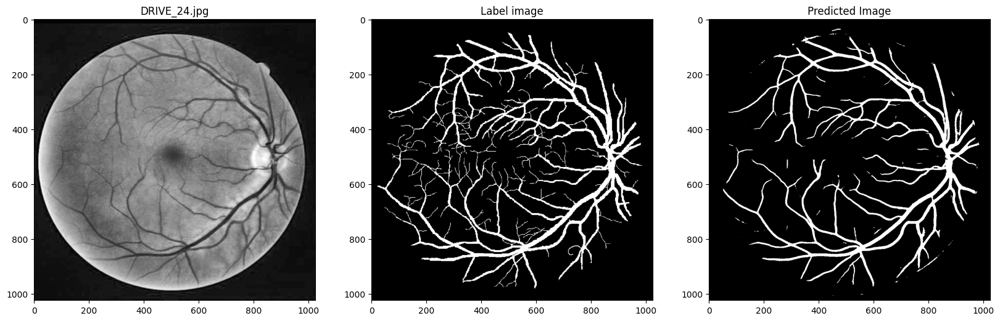

=====DRIVE_32.jpg result======
sensitivity: 0.7385386903026415
specificity: 0.9855685992661225
IOU: 0.6355479727017262


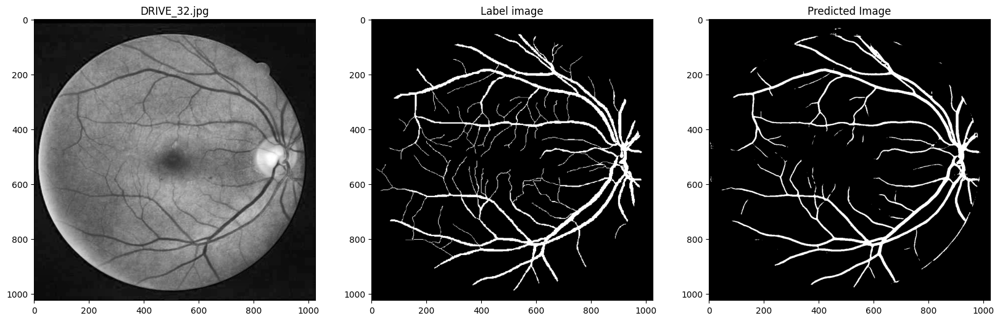

=====DRIVE_36.jpg result======
sensitivity: 0.6975204727585179
specificity: 0.9855648128133955
IOU: 0.6237455309540237


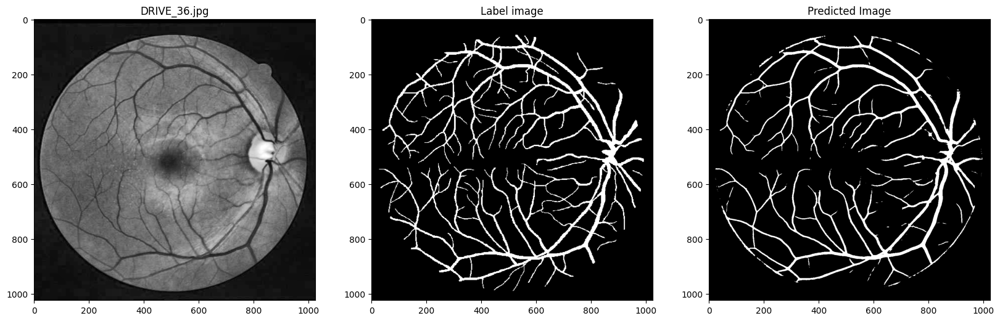

=====DRIVE_37.jpg result======
sensitivity: 0.7299048368241066
specificity: 0.9858283118210248
IOU: 0.6357027309924826


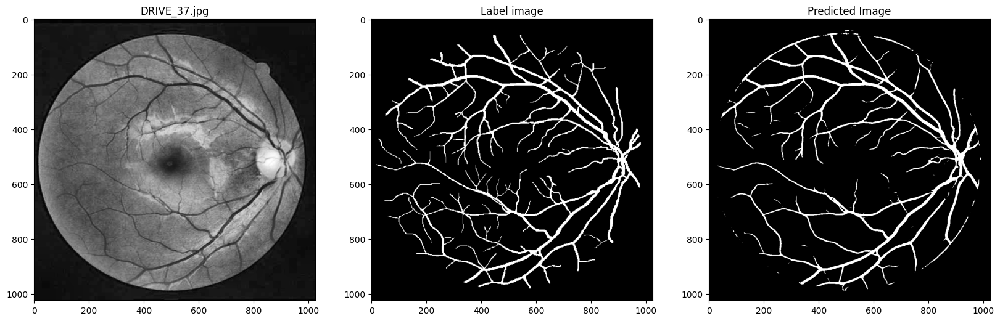

=====DRIVE_13.jpg result======
sensitivity: 0.6887435932414787
specificity: 0.9834409852529203
IOU: 0.5975399442049201


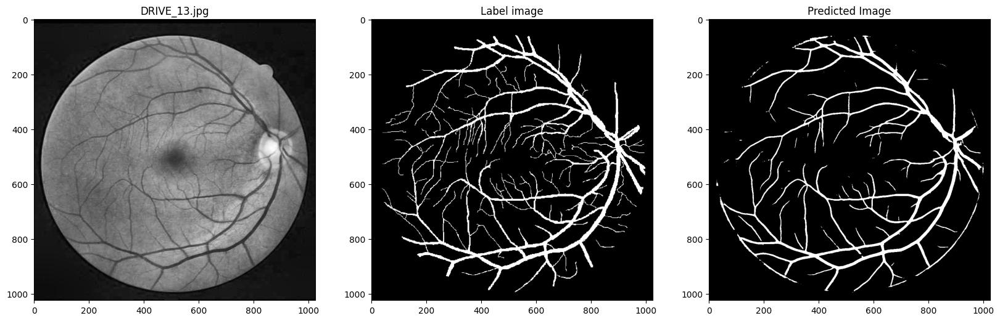

=====DRIVE_30.jpg result======
sensitivity: 0.6899614791051487
specificity: 0.9823892172376002
IOU: 0.5717349713019837


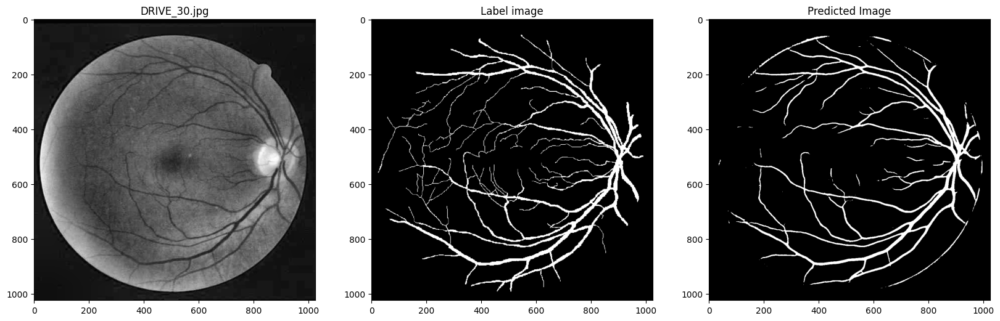

In [4]:
custom_objects = {'DiceLoss': loss.DiceLoss(), 
                  'sensitivity': metrics.sensitivity,
                  'specificity': metrics.specificity,
                  'accuracy' : metrics.accuracy,
                  'f1_score' : metrics.f1_score,
                  'iou' : metrics.iou}

MODEL_PATH = '/visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_50ep_512_sG_wo_slice.tf/41--0.1606-0.8070-0.9866-0.2147-0.7548-0.9828.pb'
TEST_SOURCE = '/visuworks/Dataset/Selected Dataset 3/Test'
test_preproc = preprocess.build_augmentation_for_general(RESIZE_SHAPE[0], RESIZE_SHAPE[0], is_train=False)
model = tf.keras.models.load_model(MODEL_PATH, custom_objects=custom_objects)

# file_list = ["AFIO", "ARIA", "Chase", "DR_HAGIS", "DRIVE", "DualModal", "FIVES", "HRF", "IOSTAR", "LES-AV", "ORVS", "RETA", "STARE", "TREND", "UoA-DR"]
# for file in file_list:
metrics.plot_result_for_SG(TEST_SOURCE, "DRIVE", model=model, img_size=INPUT_SHAPE, resize_shape=RESIZE_SHAPE, preproc=test_preproc)